#### Crystal Violet Plaques

In [ ]:
import os
import sys
import matplotlib.pyplot as plt

import PyPlaque
from PyPlaque.experiment import ExperimentCrystalVioletPlaque, ExperimentFluorescencePlaque
from PyPlaque.phenotypes import Plaque, FluorescencePlaque, CrystalVioletPlaque
from PyPlaque.specimen import PlaquesImageGray, PlaquesImageRGB, PlaquesMask, PlaquesWell, PlateImage
from PyPlaque.utils import centroid, check_numbers, fixed_threshold



In [77]:
#loading multiple plates and plate masks as an experiment
exp = ExperimentCrystalVioletPlaque('../data/samples_suba/plaques_image_png/',
                                    '../data/samples_suba/plaques_mask_png/')

In [78]:
#Reading the directories for the individual plates and getting the corresponding mask directories
plate_dirs, plate_mask_dirs = exp.get_individual_plates()

In [79]:
print(plate_dirs, plate_mask_dirs)

['IMG_6446', 'IMG_6440'] ['IMG_6446', 'IMG_6440']


In [80]:
exp.get_number_of_plates()

2

/var/folders/ww/drh8wc992nxcqb4z8dmykc440000gn/T/ipykernel_77009/1514830072.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


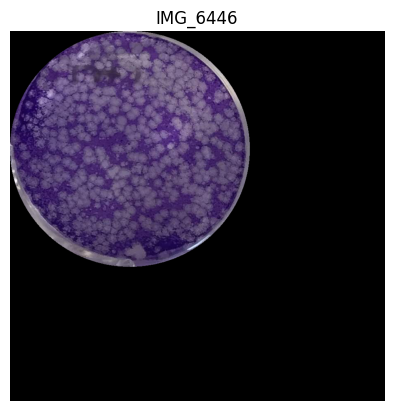

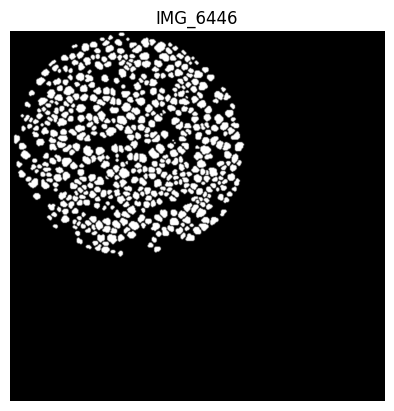

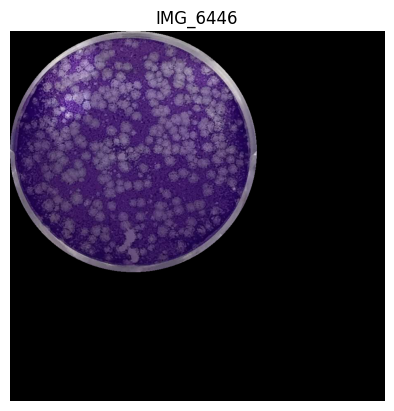

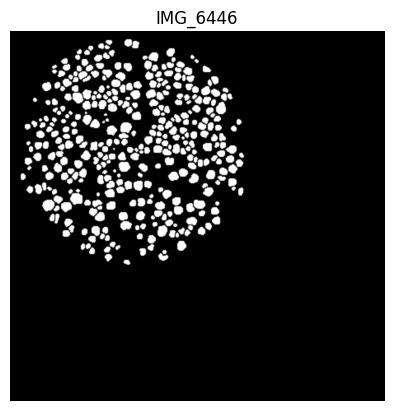

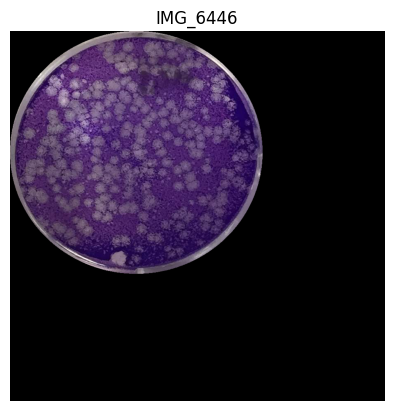

...

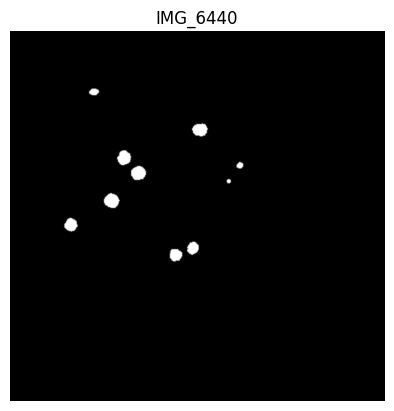

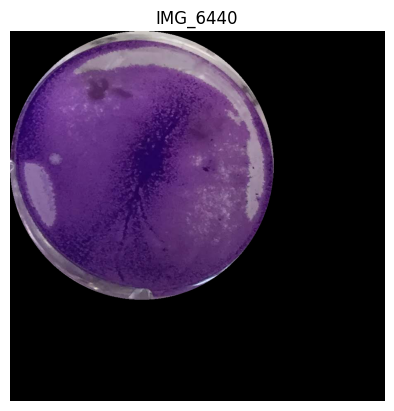

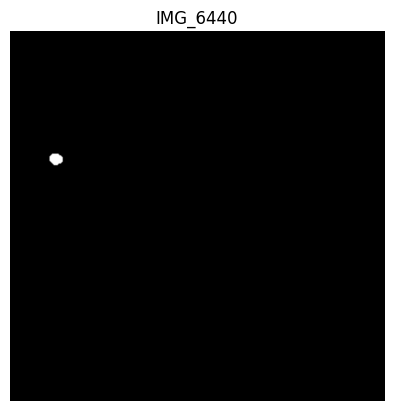

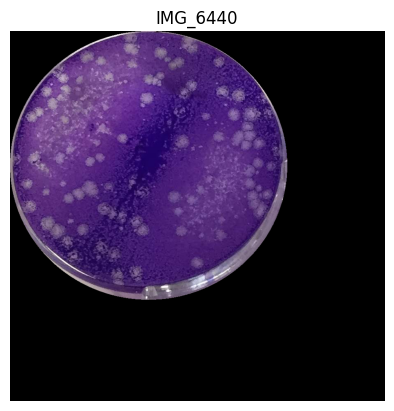

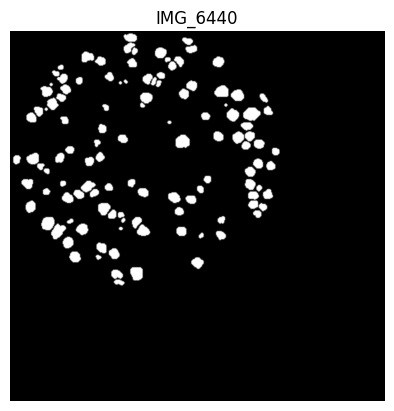

In [81]:
#Using read_from_path to get the actual images in the paths
#Here we assume an identical structure under plaques_meta_dir and plaques_mask_meta_dir

plaques_meta_dir = '../data/samples_suba/plaques_image_png/'
plaques_mask_meta_dir = '../data/samples_suba/plaques_mask_png/'


plate_dict = {}
for d in list(plate_dirs):
    i = 1
    plate_dict[d] = {}
    plate_dict[d]['img'] = {}
    plate_dict[d]['mask'] = {}
    for f in os.listdir(os.path.join(exp.plate_folder,d)):
        plate_dict[d]['img'][i] = exp.read_from_path(str(os.path.join(exp.plate_folder,d,f)))
        plt.figure()
        plt.title(d)
        plt.axis('off')
        plt.imshow(plate_dict[d]['img'][i])
        plate_dict[d]['mask'][i] = exp.read_from_path(str(os.path.join(exp.plate_mask_folder,d,f)))
        plt.figure()
        plt.title(d)
        plt.axis('off')
        plt.imshow(plate_dict[d]['mask'][i])
        i+=1

In [82]:
list(plate_dict['IMG_6440']['img'].keys())

[1, 2, 3, 4, 5, 6]

In [83]:
import numpy as np

plate_dict2 = {}
for d in list(plate_dirs):
    i = 1
    plate_dict2[d] = {}
    plate_dict2[d]['img'] = {}
    plate_dict2[d]['mask'] = {}
    for f in os.listdir(os.path.join(exp.plate_folder,d)):
        plate_dict2[d]['img'][i] = np.asarray(exp.read_from_path(
            str(os.path.join(exp.plate_folder,d,f)),color_mode="grayscale"))
        plate_dict2[d]['mask'][i] = np.asarray(exp.read_from_path(
            str(os.path.join(exp.plate_mask_folder,d,f)),color_mode="grayscale"))
        i+=1

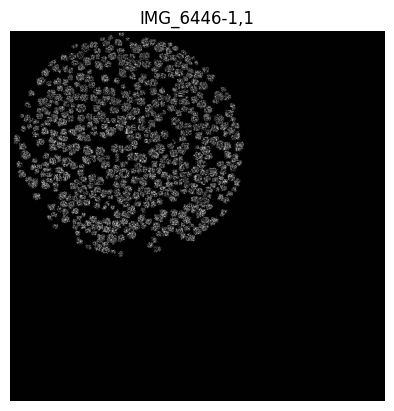

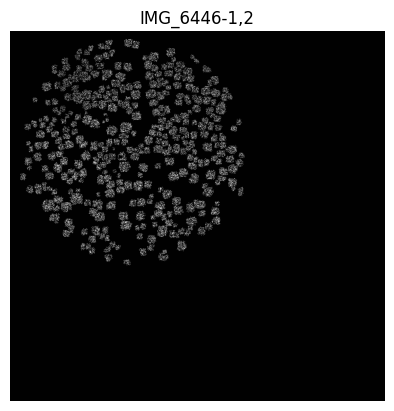

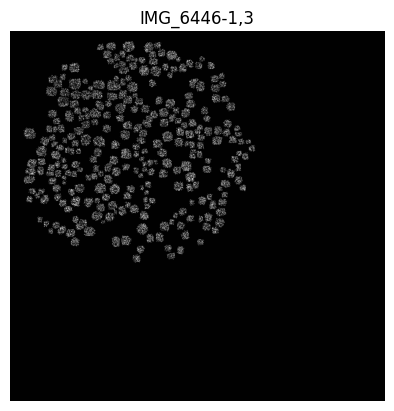

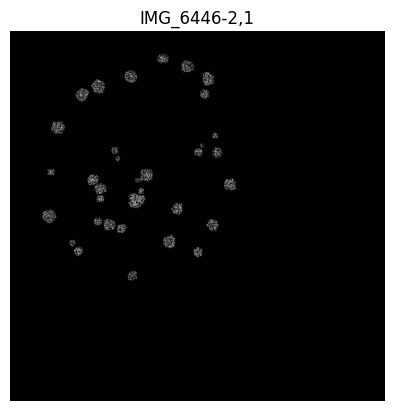

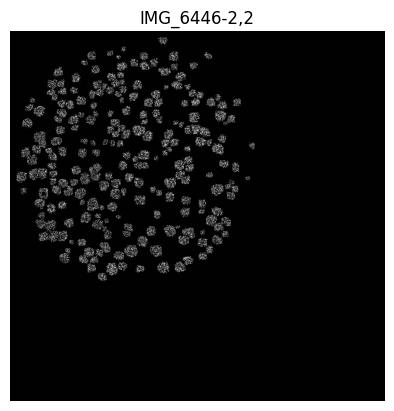

...

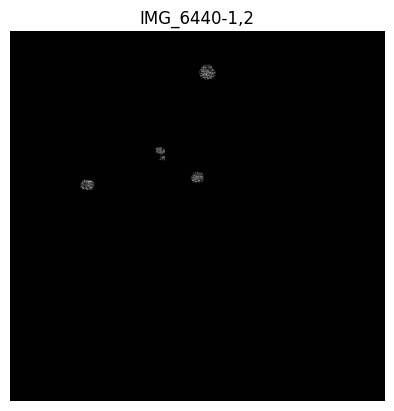

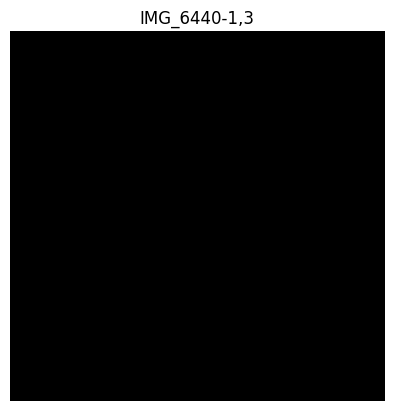

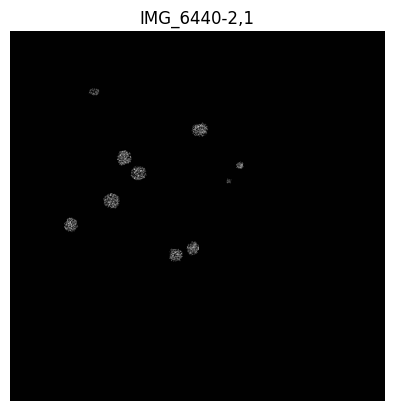

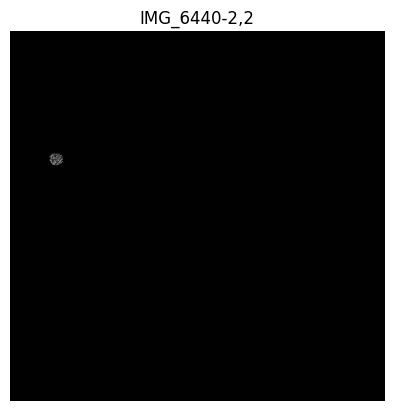

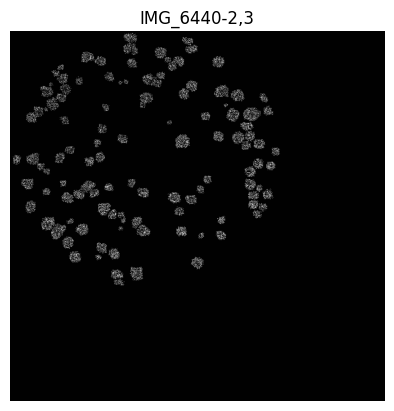

In [84]:
nrows = 2
ncols = 3

c = 1
for d in plate_dict2.keys():
    c = 1
    for i in range(nrows):
        for j in range(ncols):
            plaques_well = PlaquesWell(i+1,j+1,plate_dict2[d]['img'][c],plate_dict2[d]['mask'][c])
            plt.figure()
            plt.axis('off')
            plt.title(d+"-"+str(i+1)+","+str(j+1))
            plt.imshow(plaques_well.get_image(),cmap='gray')
            # plt.savefig("../../../manuscript/figs/masked_plaques_6440_"+str(i+1)+str(j+1)+".png",
            # bbox_inches='tight', dpi=300)
            c+=1


In [85]:
#Getting count of plaques from the binary masks of the plaques

nrows = 2
ncols = 3

c = 1
for d in plate_dict2.keys():
    c = 1
    for i in range(nrows):
        for j in range(ncols):
            plaques_mask = PlaquesMask(d+"-"+str(i+1)+","+str(j+1),plate_dict2[d]['mask'][c])
            plaques_list = plaques_mask.get_plaques()
            print(plaques_mask.name," : ", len(plaques_list))
            c+=1

IMG_6446-1,1  :  223
IMG_6446-1,2  :  143
IMG_6446-1,3  :  116
IMG_6446-2,1  :  3
IMG_6446-2,2  :  61
IMG_6446-2,3  :  1
IMG_6440-1,1  :  12
IMG_6440-1,2  :  0
IMG_6440-1,3  :  0
IMG_6440-2,1  :  1
IMG_6440-2,2  :  0
IMG_6440-2,3  :  18


IMG_6446-1,1  :  63
IMG_6446-1,1  :  113


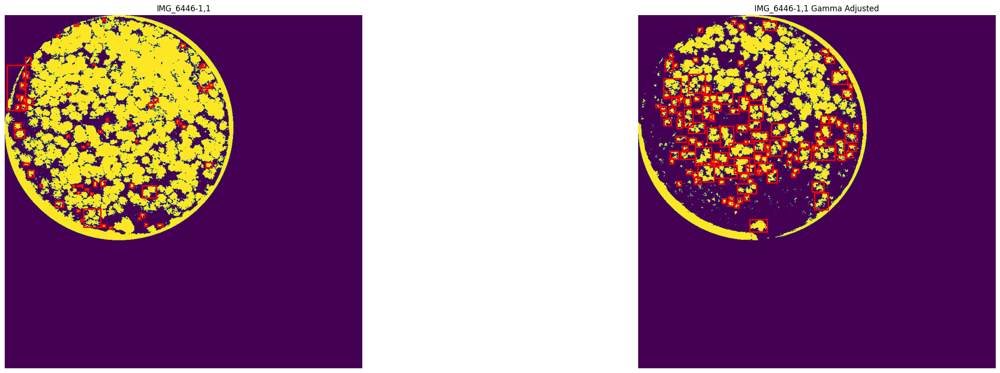

IMG_6446-1,2  :  173
IMG_6446-1,2  :  84


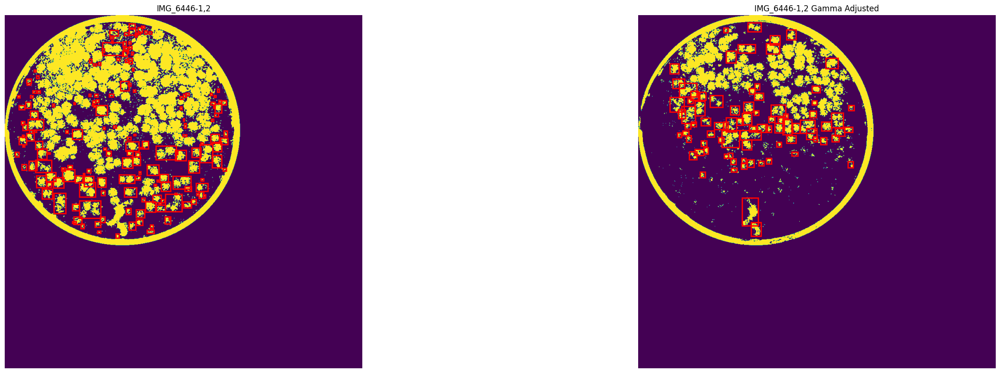

IMG_6446-1,3  :  168
IMG_6446-1,3  :  106


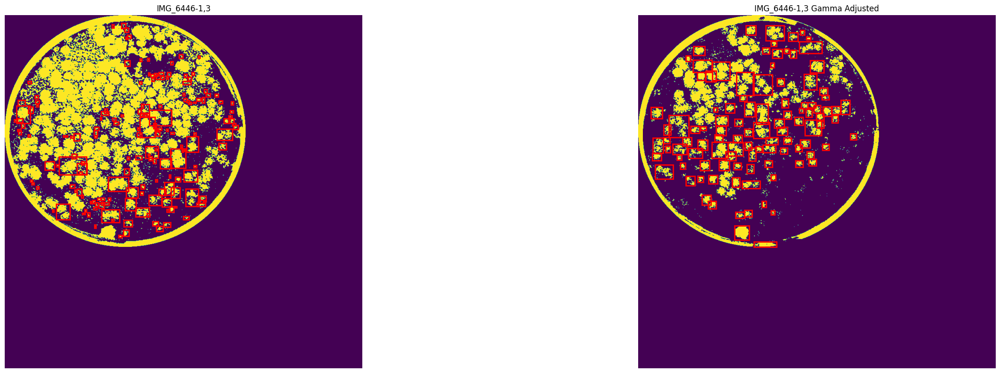

IMG_6446-2,1  :  307
IMG_6446-2,1  :  17


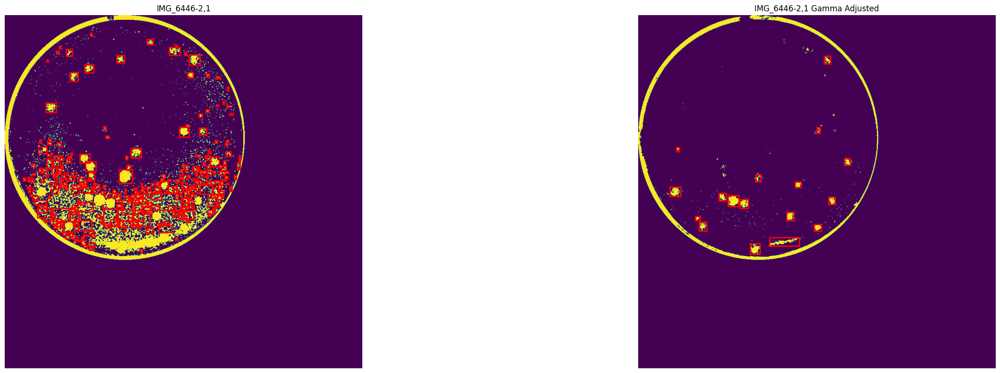

IMG_6446-2,2  :  230
IMG_6446-2,2  :  149


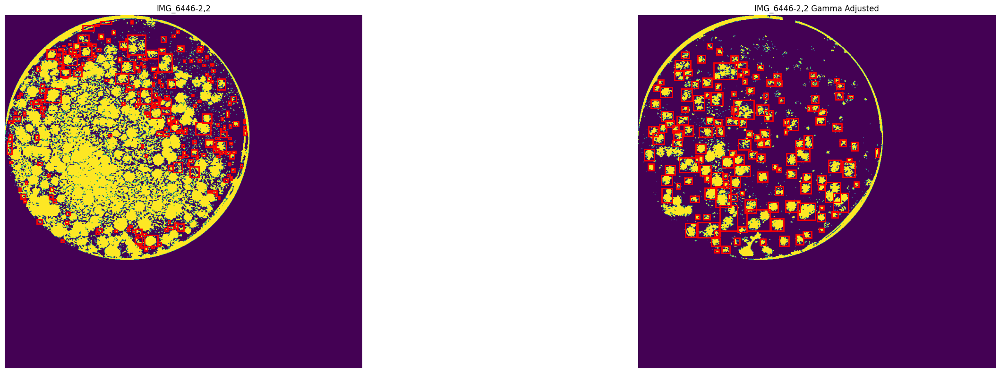

IMG_6446-2,3  :  287
IMG_6446-2,3  :  3


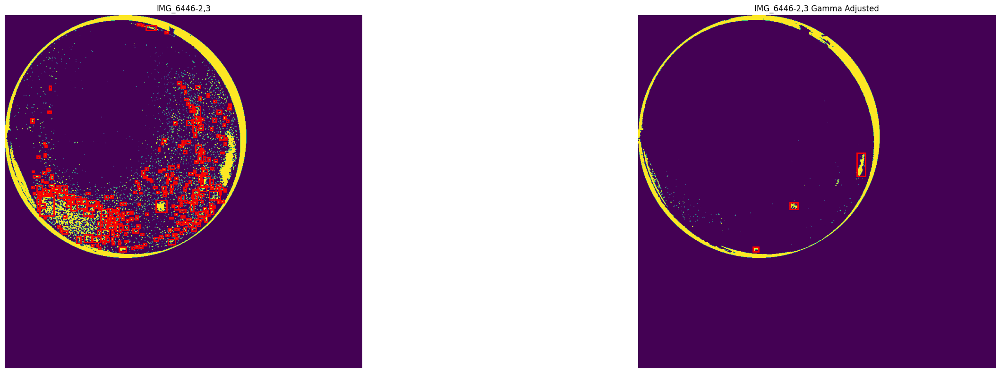

IMG_6440-1,1  :  144
IMG_6440-1,1  :  39


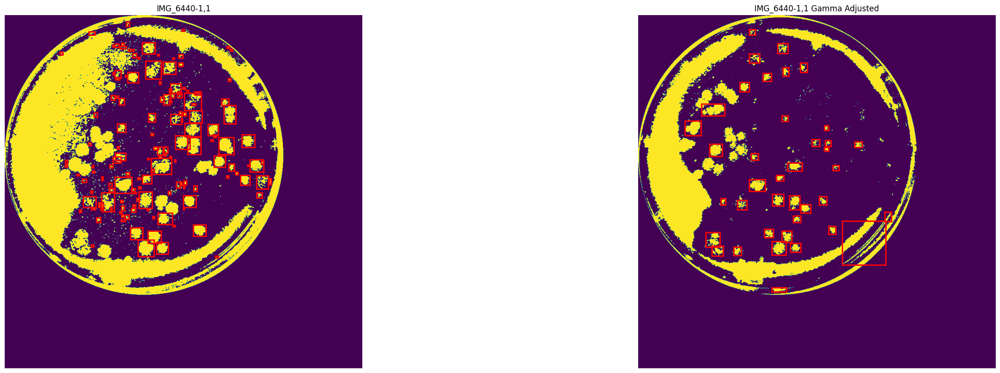

IMG_6440-1,2  :  36
IMG_6440-1,2  :  9


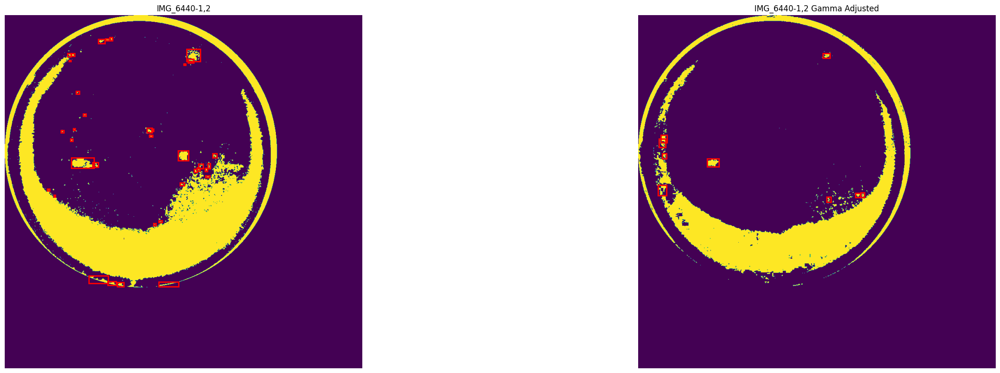

IMG_6440-1,3  :  133
IMG_6440-1,3  :  13


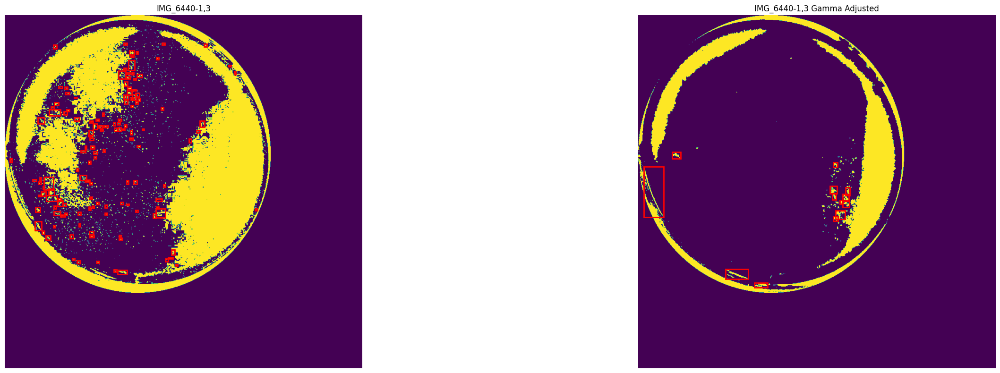

IMG_6440-2,1  :  87
IMG_6440-2,1  :  6


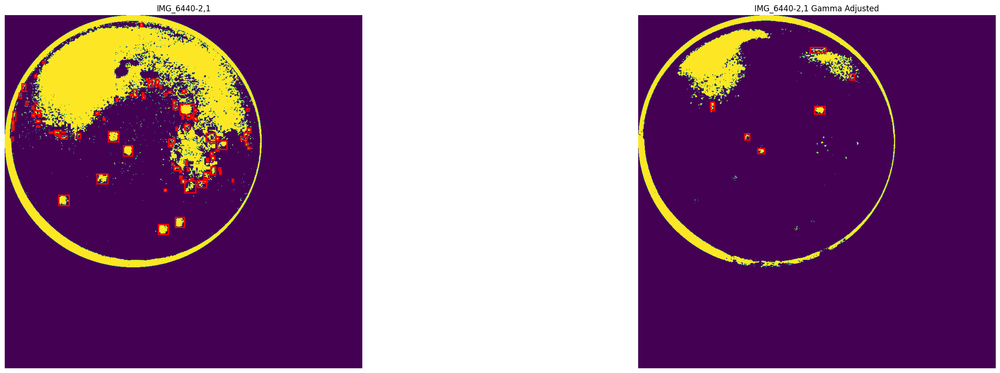

IMG_6440-2,2  :  108
IMG_6440-2,2  :  12


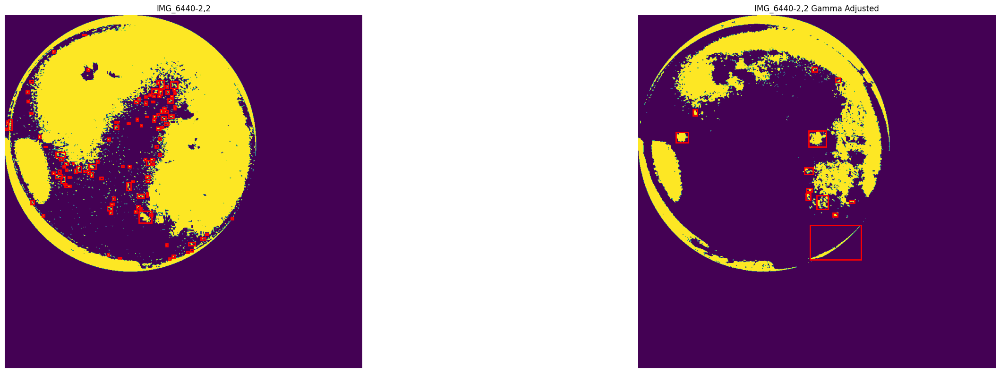

IMG_6440-2,3  :  158
IMG_6440-2,3  :  83


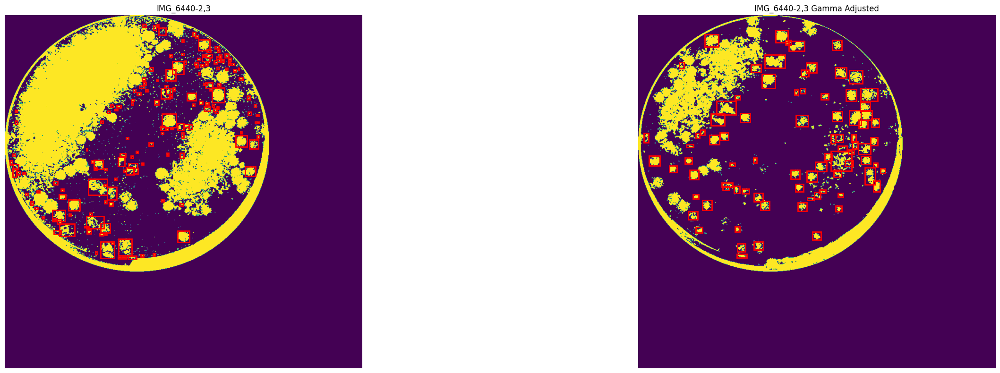

In [86]:
#Verifying the count of plaques from the images of the plaques themselves, also putting bounding boxes to check which ones are detected
import skimage
import matplotlib.patches as mpatches

nrows = 2
ncols = 3

c = 1
for d in plate_dict2.keys():
    c = 1
    for i in range(nrows):
        for j in range(ncols):
            img_gad = skimage.exposure.adjust_gamma(plate_dict2[d]['img'][c], gamma=1.32,gain=1)

            plaques_mask = PlaquesImageGray(d+"-"+str(i+1)+","+str(j+1),plate_dict2[d]['img'][c],
                                            threshold=0.25,sigma=0.4)
            plaques_list = plaques_mask.get_plaques(min_area = 15, max_area = 1200)

            plaques_mask_gad = PlaquesImageGray(d+"-"+str(i+1)+","+str(j+1),img_gad,threshold=0.25,
                                                sigma=0.4)
            plaques_list_gad = plaques_mask_gad.get_plaques(min_area = 50, max_area = 1200)

            fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(32,8))

            ax1.imshow(plaques_mask.plaques_mask)
            for plq in plaques_list:
                rect = mpatches.Rectangle((plq.bbox[1], plq.bbox[0]), plq.bbox[3] - plq.bbox[1], 
                                          plq.bbox[2] - plq.bbox[0],
                                  fill=False, edgecolor='red', linewidth=2)
                ax1.add_patch(rect)
            ax1.set_axis_off()
            ax1.set_title(d+"-"+str(i+1)+","+str(j+1))
            
            print(plaques_mask.name," : ", len(plaques_list))

            ax2.imshow(plaques_mask_gad.plaques_mask)
            for plq in plaques_list_gad:
                rect = mpatches.Rectangle((plq.bbox[1], plq.bbox[0]), plq.bbox[3] - plq.bbox[1], 
                                          plq.bbox[2] - plq.bbox[0],
                                  fill=False, edgecolor='red', linewidth=2)
                ax2.add_patch(rect)
            ax2.set_axis_off()
            ax2.set_title(d+"-"+str(i+1)+","+str(j+1)+" Gamma Adjusted")
            
            print(plaques_mask_gad.name," : ", len(plaques_list_gad))
            
            plt.tight_layout()
            plt.show()
            c+=1

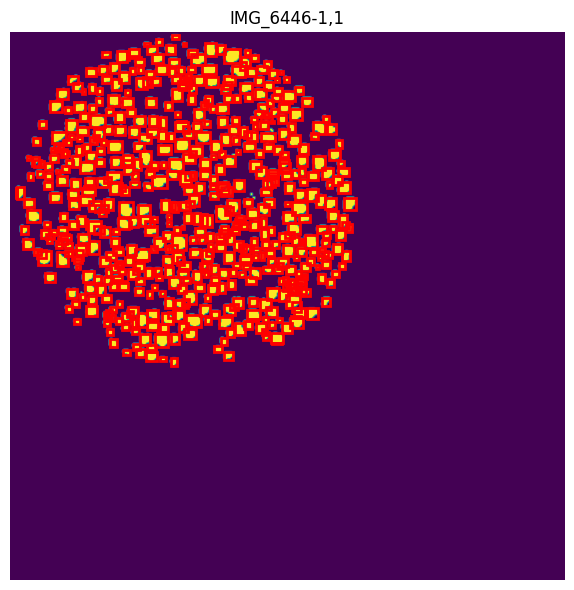

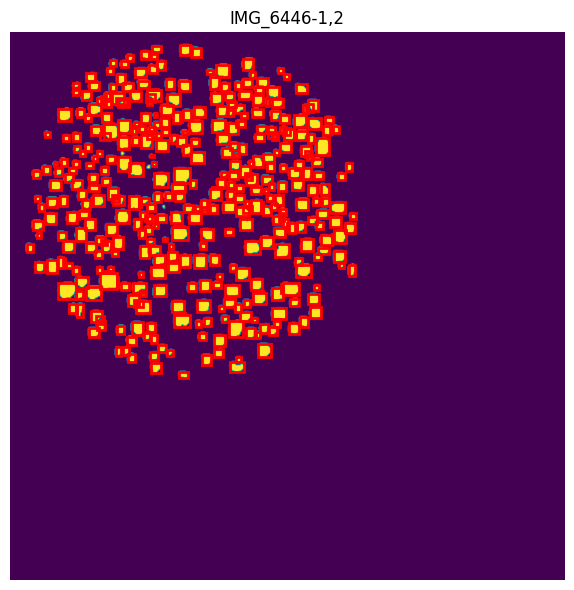

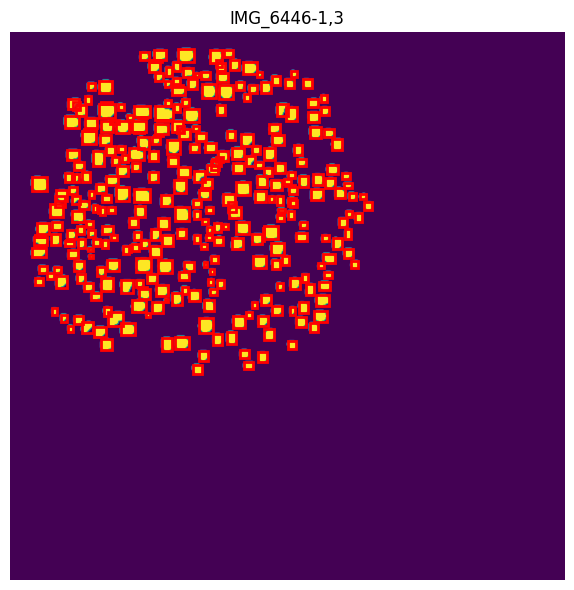

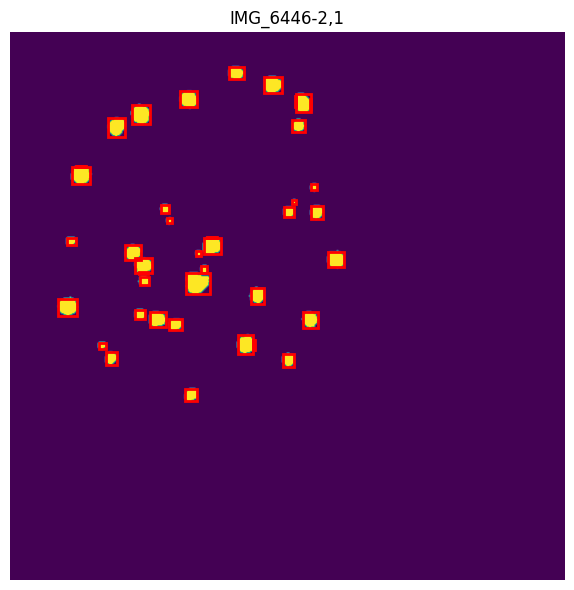

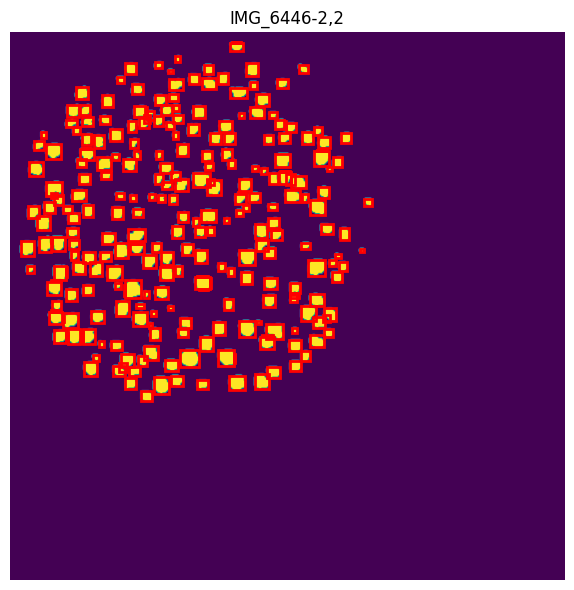

...

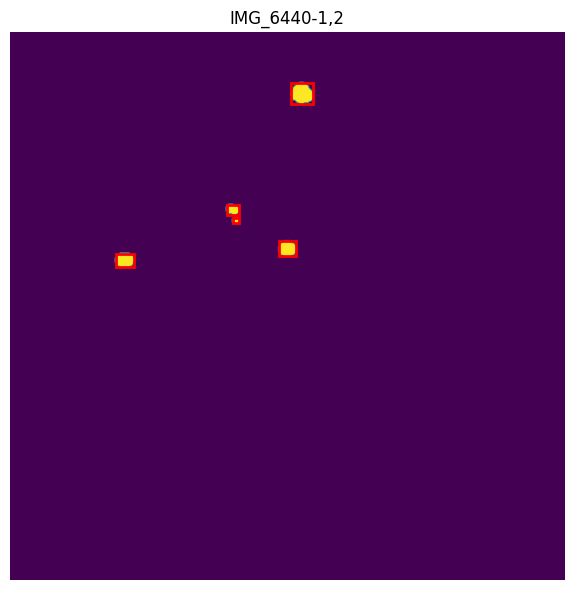

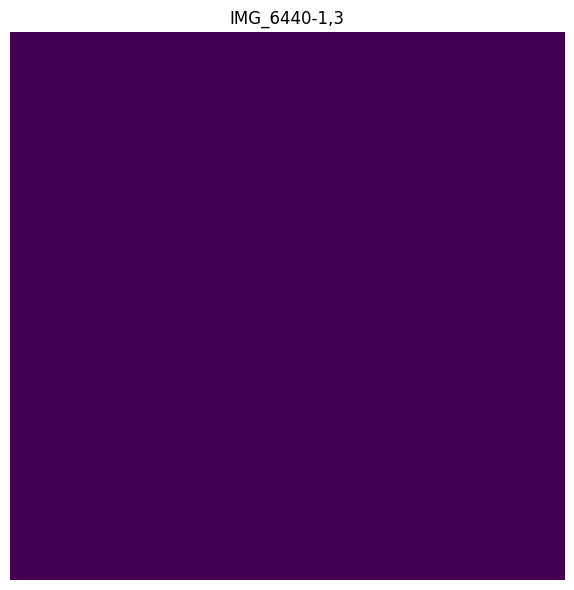

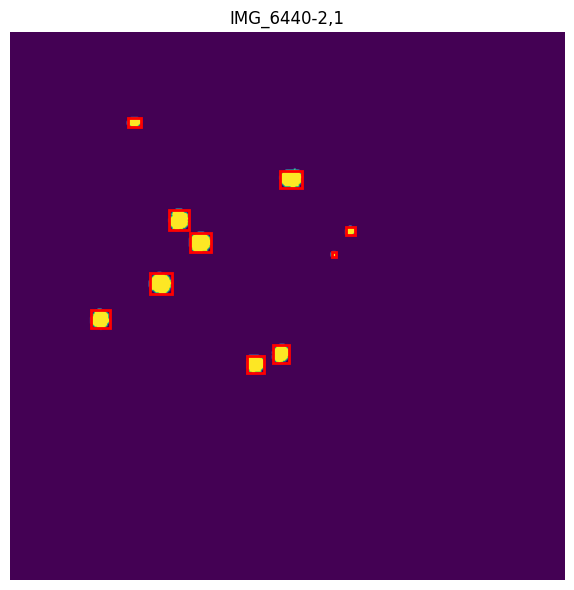

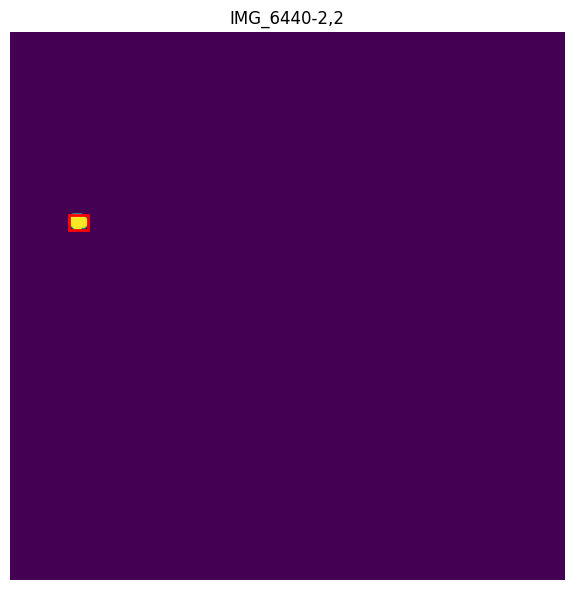

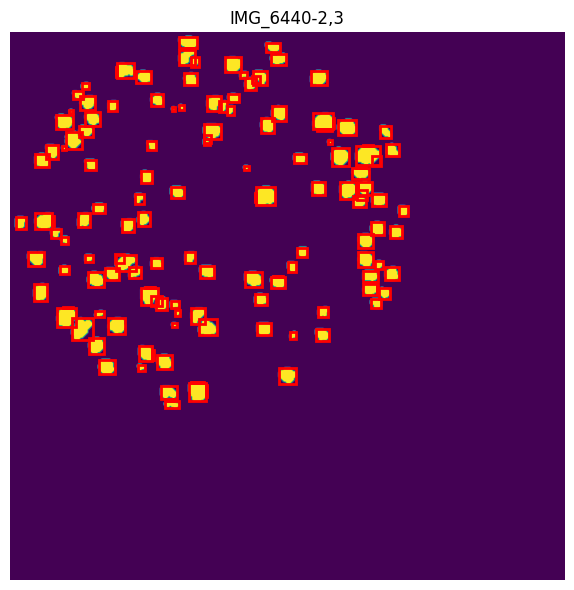

In [87]:
# Getting characteristics of individual plaques
nrows = 2
ncols = 3

c = 1
for d in plate_dict2.keys():
    c = 1
    for i in range(nrows):
        for j in range(ncols):
            plaques_mask = PlaquesMask(d+"-"+str(i+1)+","+str(j+1),plate_dict2[d]['mask'][c])
            plaques_list = plaques_mask.get_plaques(min_area=15,max_area=1200)
            
            fig, ax = plt.subplots(figsize=(10, 6))
            ax.imshow(plate_dict2[d]['mask'][c])

            for plq in plaques_list:
                rect = mpatches.Rectangle((plq.bbox[1], plq.bbox[0]), plq.bbox[3] - plq.bbox[1], 
                                          plq.bbox[2] - plq.bbox[0],
                                  fill=False, edgecolor='red', linewidth=2)
                ax.add_patch(rect)

            
            ax.set_axis_off()
            plt.title(d+"-"+str(i+1)+","+str(j+1))
            plt.tight_layout()
            plt.show()
            c+=1

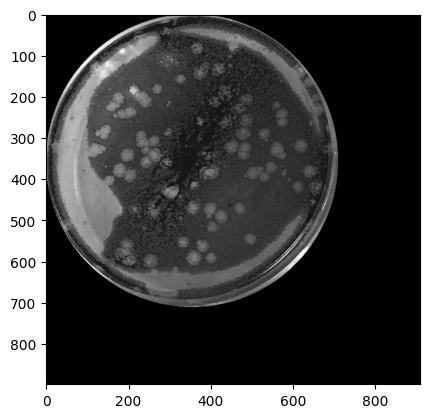

In [88]:
plt.imshow(plate_dict2['IMG_6440']['img'][1],cmap='gray')

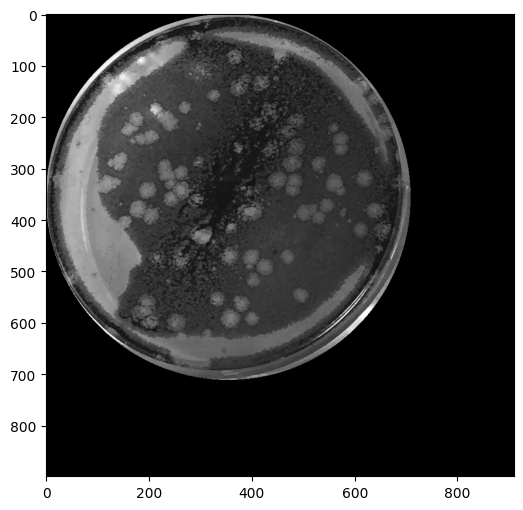

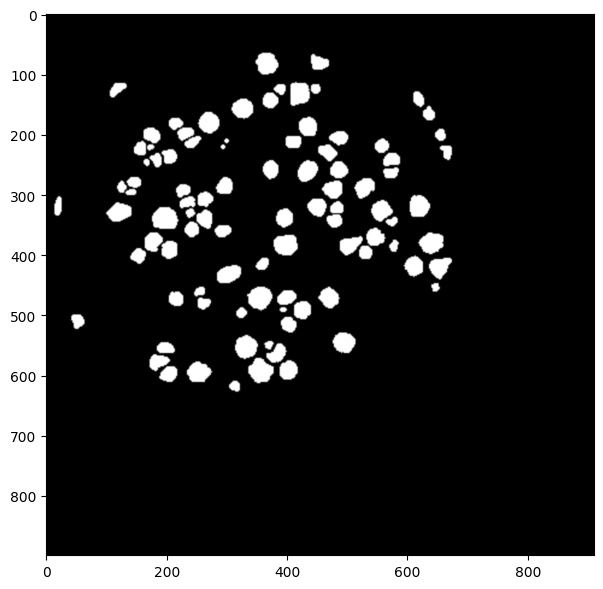

Centroid : (618.4565217391304, 313.4130434782609)
Area : 256


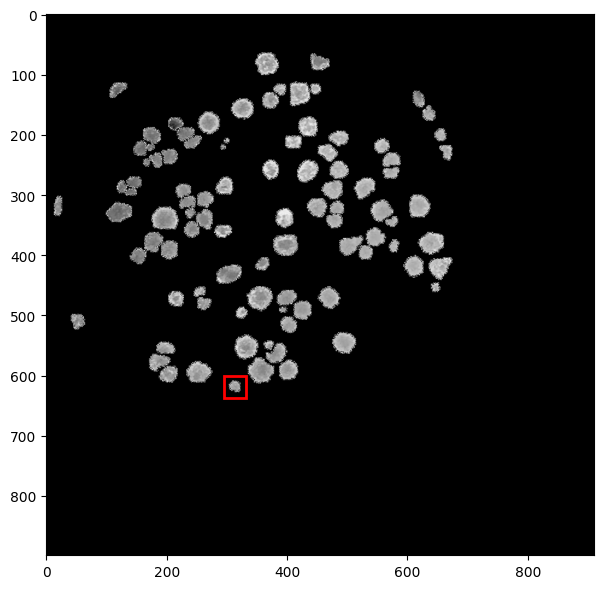

Centroid : (83.29555555555555, 366.3888888888889)
Area : 1224


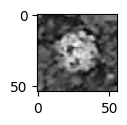

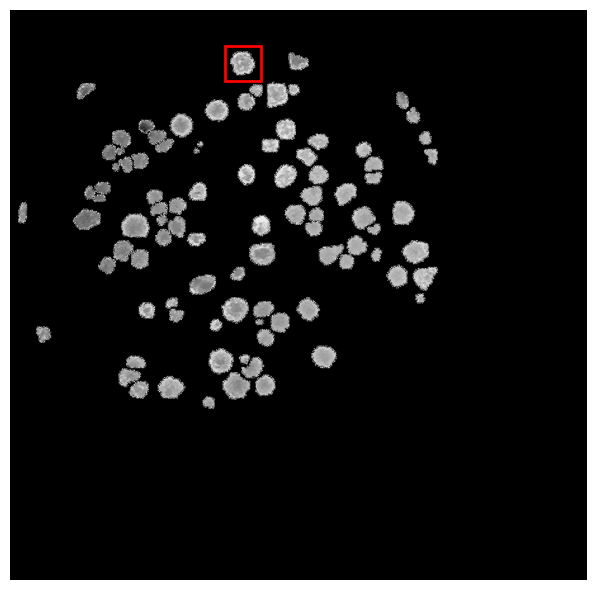

In [95]:
#Getting one individual plaque and its characteristics
nrows = 2
ncols = 3

i = 0
j = 0
c = 1
offset = 10

plate_dict2_6440 = plate_dict2['IMG_6440']
plaques_mask = PlaquesMask(d+"-"+str(i+1)+","+str(j+1),plate_dict2_6440['mask'][c])
plaques_list = plaques_mask.get_plaques(min_area=15,max_area=1200)

#Plotting the image of the well
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(plate_dict2_6440['img'][c],cmap='gray')

#Plotting the mask of the well
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(plate_dict2_6440['mask'][c],cmap='gray')

plt.tight_layout()
plt.show()

#Finding the lowest plaque in the image and printing its properties
min_y = 0
for plq in plaques_list:
    if (plq.bbox[2] + offset) > min_y:
        min_y = plq.bbox[2] + offset
        lowest_plaque = plq
print('Centroid :',lowest_plaque.centroid)
print('Area :', (lowest_plaque.bbox[3] - lowest_plaque.bbox[1])*
      (lowest_plaque.bbox[2] - lowest_plaque.bbox[0]))

#Finding a bounding box around the lowest plaque in the image
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(plate_dict2_6440['img'][c]*plate_dict2_6440['mask'][c],cmap='gray')

rect = mpatches.Rectangle((lowest_plaque.bbox[1]-offset, lowest_plaque.bbox[0]-offset), 
                          (lowest_plaque.bbox[3]+offset) - (lowest_plaque.bbox[1]-offset), 
                          (lowest_plaque.bbox[2]+offset) - (lowest_plaque.bbox[0]-offset),
                            fill=False, edgecolor='red', linewidth=2)
ax.add_patch(rect)

# plt.savefig("../../../manuscript/figs/plaque_6440_lowest_plaque_marked.png",
# bbox_inches='tight', dpi=300)

plt.tight_layout()
plt.show()



for plq in plaques_list:
    plaque = plate_dict2_6440['img'][c][plq.bbox[0]-offset : plq.bbox[2]+offset , 
                                        plq.bbox[1]-offset : plq.bbox[3]+offset  ]

    fig, ax = plt.subplots(figsize=(2, 1))
    ax.imshow(plaque,cmap='gray')

    print('Centroid :',plq.centroid)
    print('Area :', (plq.bbox[3] - plq.bbox[1])*(plq.bbox[2] - plq.bbox[0]))

    # plt.savefig("../../../manuscript/figs/plaque_6440_11_0.png",bbox_inches='tight', dpi=300)

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(plate_dict2_6440['img'][c]*plate_dict2_6440['mask'][c],cmap='gray')

    rect = mpatches.Rectangle((plq.bbox[1]-offset, plq.bbox[0]-offset),
                               (plq.bbox[3]+offset) - (plq.bbox[1]-offset), 
                               (plq.bbox[2]+offset) - (plq.bbox[0]-offset),
                            fill=False, edgecolor='red', linewidth=2)
    ax.add_patch(rect)

    # plt.savefig("../../../manuscript/figs/plaque_6440_plaque_marked.png",
    # bbox_inches='tight', dpi=300)

    break

ax.set_axis_off()
plt.tight_layout()
plt.show()

633
170.91943127962085
156.0
[294.9842022116904, 280.6232227488152]
nan
0.5636423996632819


<Figure size 640x480 with 0 Axes>

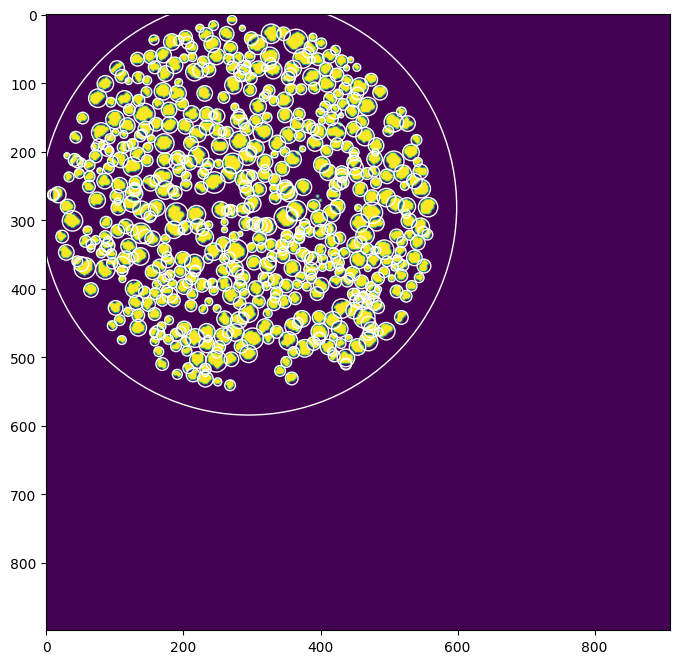

423
188.78014184397162
168.0
[296.94917257683215, 270.59338061465724]
nan
0.5673759153267016


<Figure size 640x480 with 0 Axes>

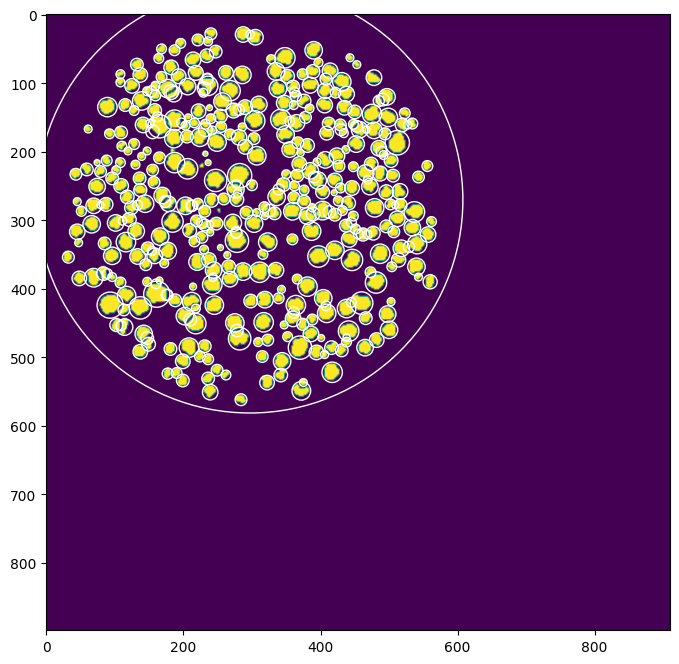

326
215.56748466257667
196.0
[294.27147239263803, 273.8819018404908]
0.2261731097532268
0.5719858440071796


<Figure size 640x480 with 0 Axes>

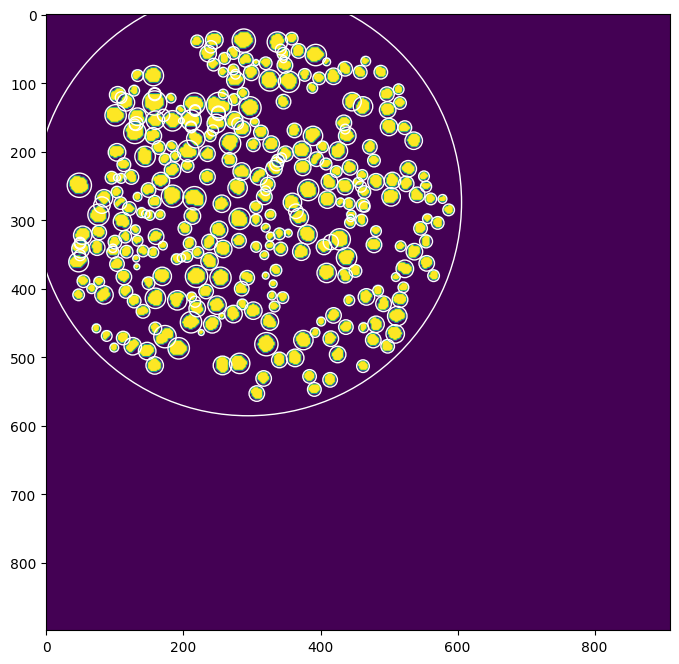

44
359.04545454545456
344.0
[319.3181818181818, 329.6136363636364]
0.2529919929792125
0.4928726495911482


<Figure size 640x480 with 0 Axes>

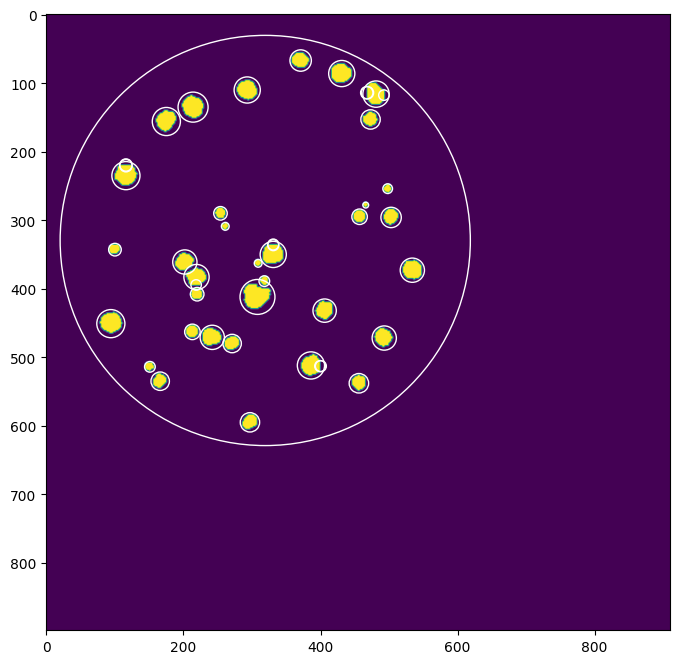

276
257.2971014492754
252.0
[285.4909420289855, 312.838768115942]
0.40306673287356637
0.5392172585074274


<Figure size 640x480 with 0 Axes>

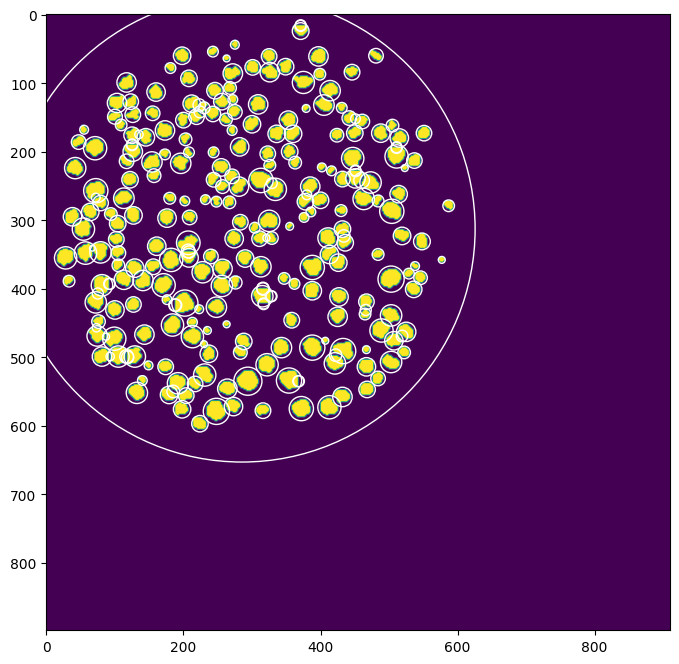

2
352.0
352.0
[350.5, 543.0]
0.28712458939669583
0.6130768524837991


<Figure size 640x480 with 0 Axes>

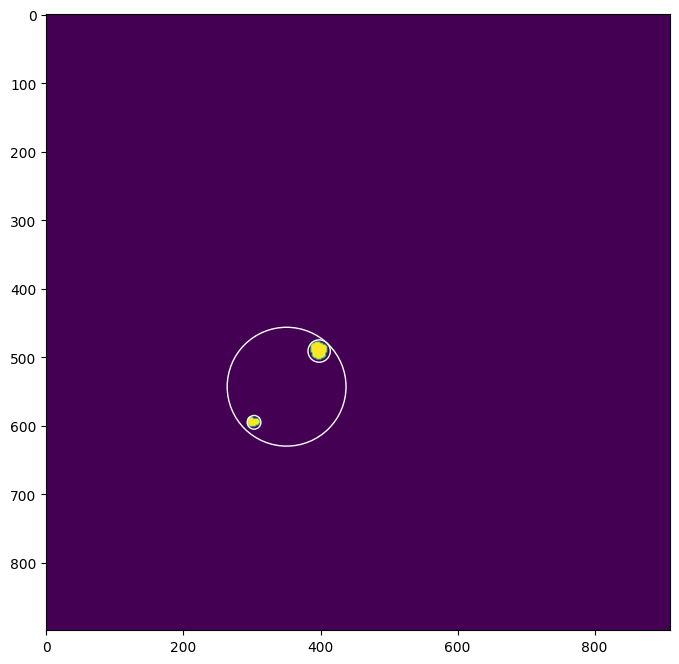

147
379.5442176870748
332.0
[342.8843537414966, 337.6156462585034]
0.36438475006351956
0.40395652208149535


<Figure size 640x480 with 0 Axes>

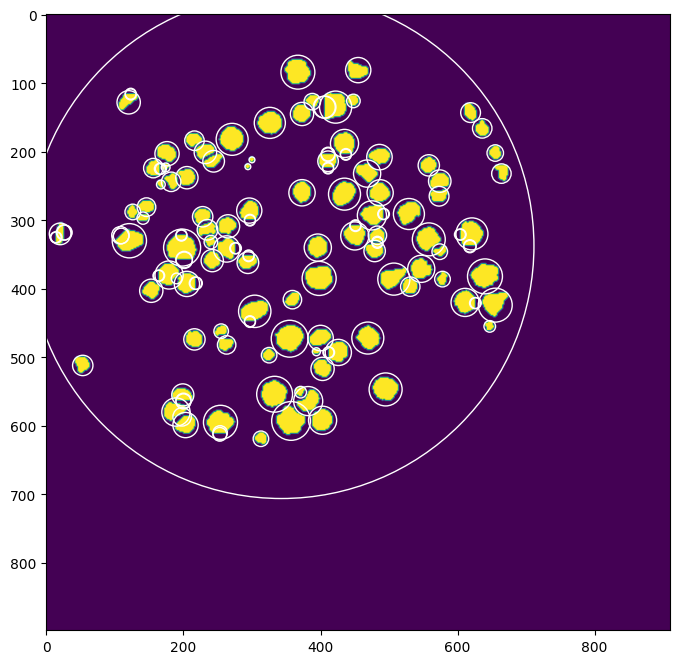

5
546.4
636.0
[371.4, 285.8]
0.4034108530553217
0.5929934353561077


<Figure size 640x480 with 0 Axes>

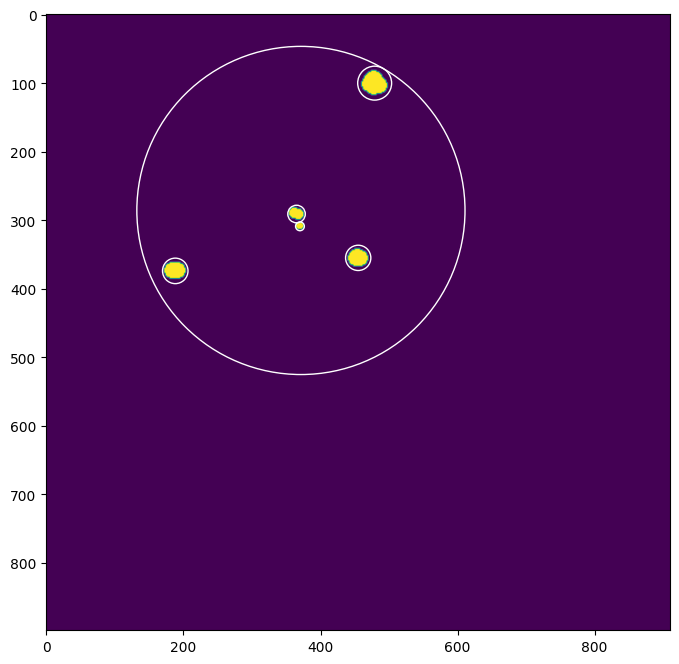

0
0
0
[0, 0]
nan
nan


/Users/de29/Applications/miniforge3/envs/pyplaque/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/de29/Applications/miniforge3/envs/pyplaque/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


<Figure size 640x480 with 0 Axes>

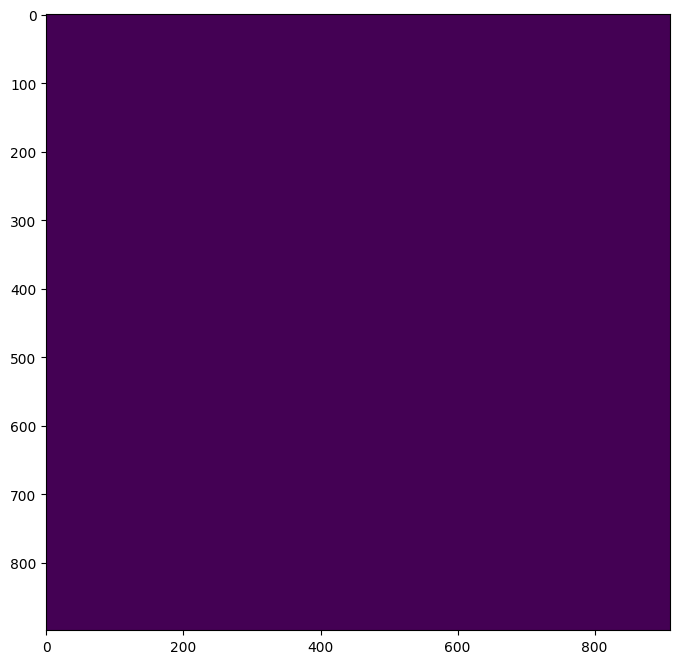

10
680.0
774.0
[358.5, 368.8]
0.35719358924147254
0.5852397856635125


<Figure size 640x480 with 0 Axes>

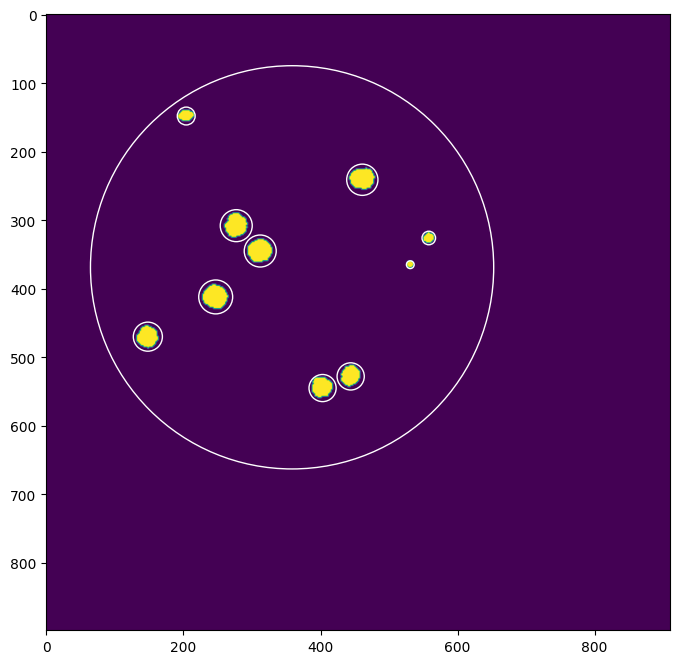

1
716.0
716.0
[112.0, 312.0]
0.6277403839758702
0.5784514682933861


<Figure size 640x480 with 0 Axes>

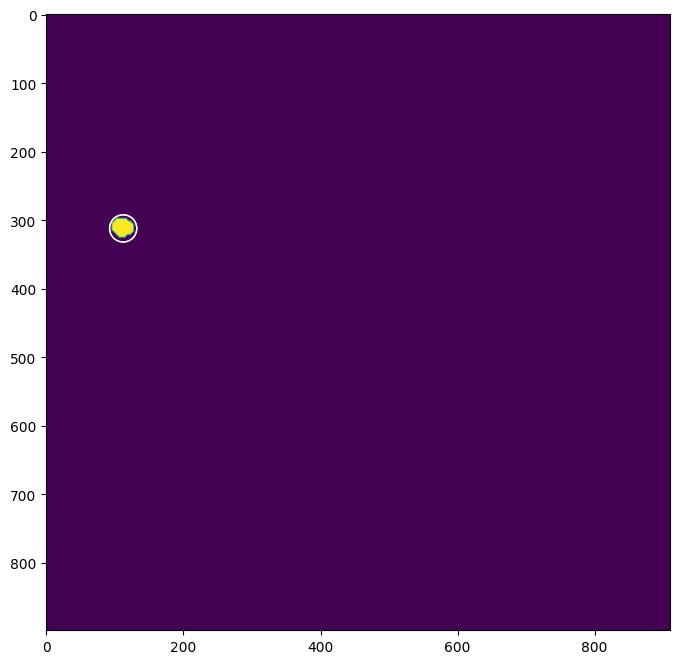

154
316.1038961038961
310.0
[333.84415584415586, 296.1655844155844]
0.3935631099150519
0.4855307840524696


<Figure size 640x480 with 0 Axes>

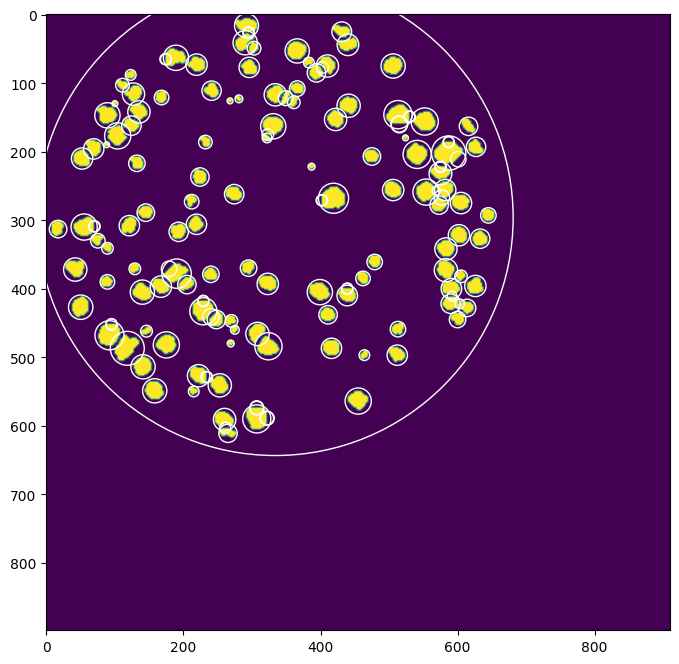

In [71]:
# Using the package to get some measurements about the plaques

nrows = 2
ncols = 3

c = 1
for d in plate_dict2.keys():
    c = 1
    for i in range(nrows):
        for j in range(ncols):
            plaques_mask = PlaquesMask(d+"-"+str(i+1)+","+str(j+1),plate_dict2[d]['mask'][c])
            plaques_list = plaques_mask.get_plaques(min_area=15,max_area=1200)
            measure_dict  = plaques_mask.get_measure(plaques_list)
            print(len(plaques_list))
            print(measure_dict['mean_plq_size'])
            print(measure_dict['med_plq_size'])
            print(measure_dict['centroid'])
            print(measure_dict['mean_plq_ecc'])
            print(measure_dict['mean_roundness'])
            plt.figure()
            plaques_mask.plot_centroid()
            c+=1

In [14]:
# Next we experiment with other measures we can get about the individual plaques
import pandas as pd


nrows = 2
ncols = 3

ecc_ls = []
roundness_ls = []
c = 1
for d in plate_dict2.keys():
    c = 1
    for i in range(nrows):
        for j in range(ncols):
            plaques_mask = PlaquesMask(d+"-"+str(i+1)+","+str(j+1),plate_dict2[d]['mask'][c])
            plaques_list = plaques_mask.get_plaques(min_area=15,max_area=1200)
            # measure_dict  = plaques_mask.get_measure(plaques_list)
            for plq in plaques_list:
                ecc_ls.append(plq.eccentricity())
                roundness_ls.append(plq.roundness())
            c+=1



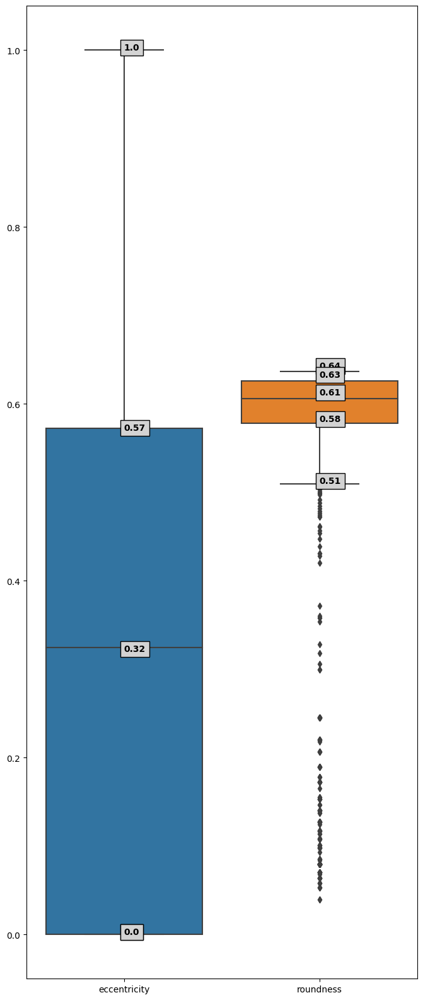

In [15]:
import seaborn as sns
from matplotlib.cbook import boxplot_stats

plq_measures_df = pd.DataFrame()
plq_measures_df['eccentricity'] = ecc_ls
plq_measures_df['roundness'] = roundness_ls
# 2. extract the boxplot stats
plq_measures_df_stats = [boxplot_stats(plq_measures_df[col].dropna().values)[0] 
                         for col in plq_measures_df.columns]
# 3. create a dataframe for the stats
stats = pd.DataFrame(plq_measures_df_stats, 
                     index=plq_measures_df.columns).iloc[:, [4, 5, 7, 8, 9]].round(2)
# plot
fig, ax = plt.subplots(figsize=(8, 20))
box_plot = sns.boxplot(data=plq_measures_df, ax=ax)
# annotate
for xtick in box_plot.get_xticks():
    for col in stats.columns:
        box_plot.text(xtick, stats[col][xtick], stats[col][xtick], horizontalalignment='left', 
                      size='medium', color='k', weight='semibold', bbox=dict(facecolor='lightgray'))

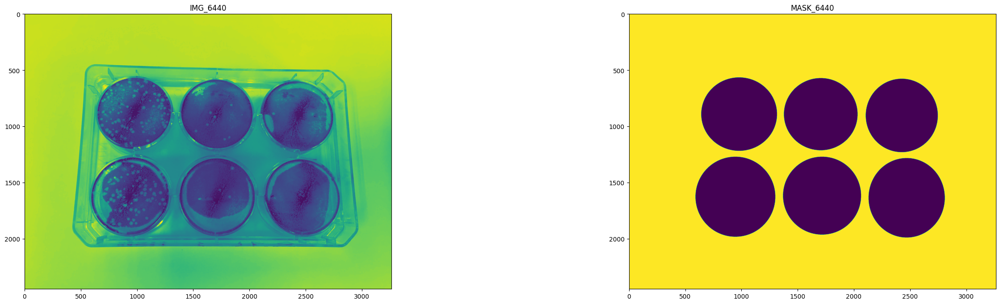

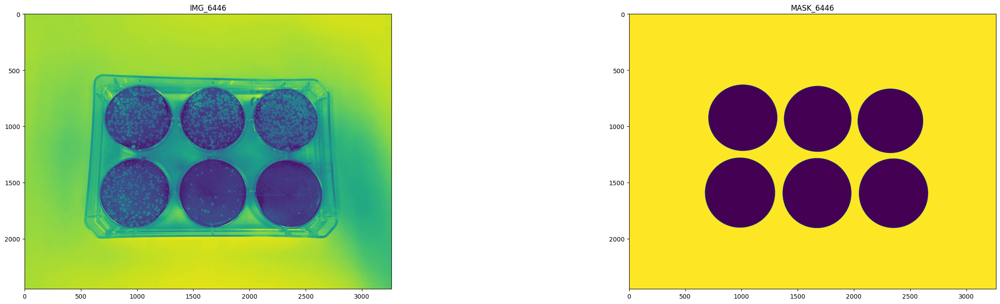

In [16]:
#Next we move on to show what we can do if we have a full plate instead of multiple wells broken up

exp = ExperimentCrystalVioletPlaque('','')
#Reading the plate image and mask from the path
full_plate_6440 = exp.read_from_path('../data/samples_suba/Full_plate_images/IMG_6440.png',
                                     color_mode = "grayscale")
full_plate_6446 = exp.read_from_path('../data/samples_suba/Full_plate_images/IMG_6446.png',
                                     color_mode = "grayscale")

full_plate_mask_6440 = exp.read_from_path('../data/samples_suba/well_masks/IMG_6440.png',
                                          color_mode = "grayscale")
full_plate_mask_6446 = exp.read_from_path('../data/samples_suba/well_masks/IMG_6446.png',
                                          color_mode = "grayscale")

plt.figure(figsize=(32,8))
plt.subplot(1, 2, 1)
plt.title('IMG_6440')
plt.imshow(full_plate_6440)

plt.subplot(1, 2, 2)
plt.title('MASK_6440')
plt.imshow(full_plate_mask_6440)

plt.figure(figsize=(32,8))
plt.subplot(1, 2, 1)
plt.title('IMG_6446')
plt.imshow(full_plate_6446)

plt.subplot(1, 2, 2)
plt.title('MASK_6446')
plt.imshow(full_plate_mask_6446)

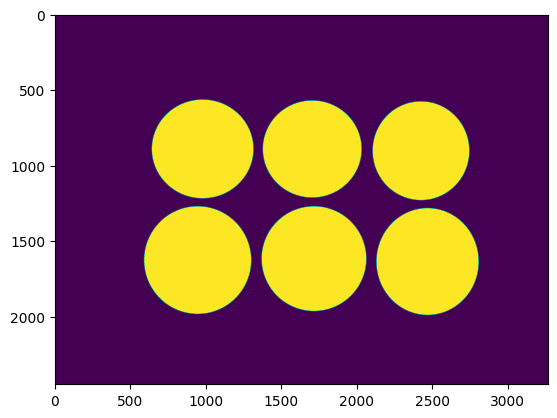

In [17]:
np_full_plate_mask_6440 = (255 - np.asarray(full_plate_mask_6440))/255 
#inverting and normalizing binary mask
plt.figure()
plt.imshow(np_full_plate_mask_6440)

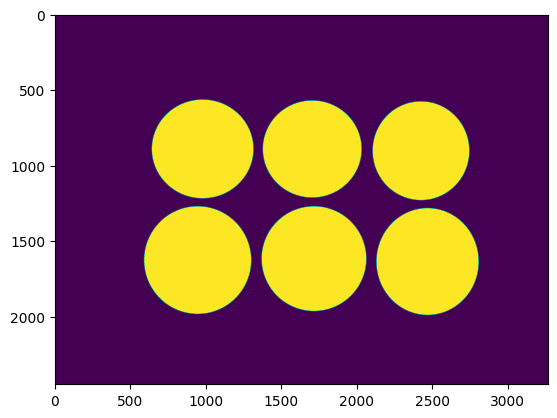

In [18]:
np_full_plate_mask_6446 = (255 - np.asarray(full_plate_mask_6446))/255 
#inverting and normalizing binary mask
plt.figure()
plt.imshow(np_full_plate_mask_6440)

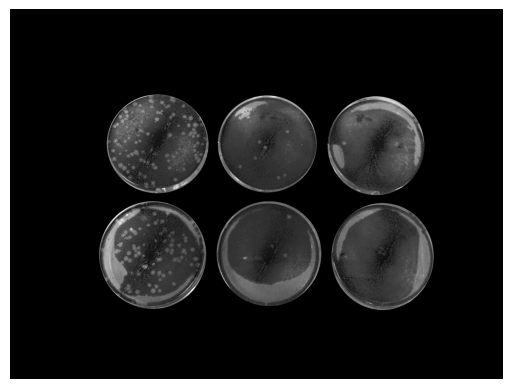

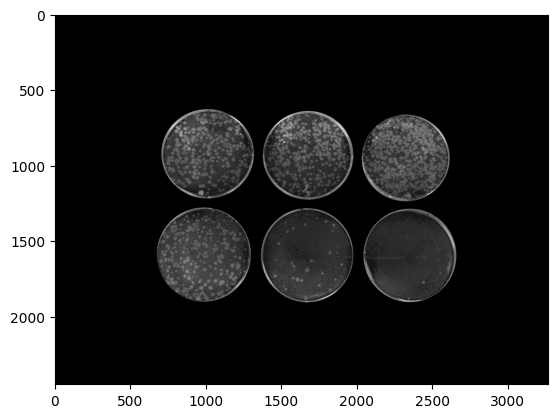

In [19]:
#Printing masked plates
masked_plate_6440 = np_full_plate_mask_6440 * full_plate_6440
masked_plate_6446 = np_full_plate_mask_6446 * full_plate_6446

plt.figure()
plt.axis('off')
plt.imshow(masked_plate_6440/255,cmap='gray')
# plt.savefig("../../../manuscript/figs/masked_plate_6440.png",bbox_inches='tight', dpi=300)
plt.figure()
plt.imshow(masked_plate_6446/255,cmap='gray')

In [20]:
import math
 
# Function to check if two circles touch each other
def circle(x1, y1, x2, y2, r1, r2):
    d = math.sqrt((x1 - x2) * (x1 - x2) + (y1 - y2) * (y1 - y2))
 
    if(d <= r1 - r2):
        #print("Circle B is inside A")
        return 0
    elif(d <= r2 - r1):
        #print("Circle A is inside B")
        return 1
    elif(d < r1 + r2):
        #print("Circle intersect to each other")
        return 2
    elif(d == r1 + r2):
        #print("Circle touch to each other")
        return 3
    else:
        #print("Circle not touch to each other")
        return 4

<Figure size 2000x1000 with 0 Axes>

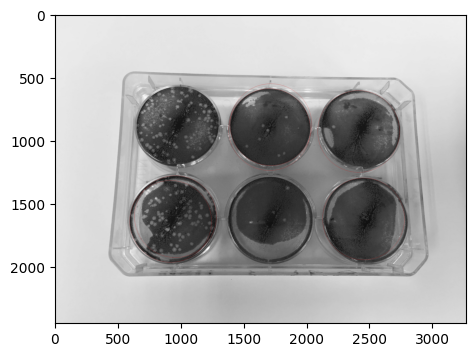

25


In [21]:
# Get wells for image instead of well mask
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, color
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.feature import canny
from skimage.draw import circle_perimeter
from skimage.util import img_as_ubyte


radii_ll = 275
radii_ul = 335
radii_intervals = 10
# Load picture and detect edges
image = img_as_ubyte(full_plate_6440)
edges = canny(image, sigma=3, low_threshold=10, high_threshold=50)


# Detect two radii
hough_radii = np.arange(radii_ll, radii_ul, radii_intervals)
hough_res = hough_circle(edges, hough_radii)

# Select the most prominent circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
                                           total_num_peaks=25)

# Filter them based on size and location
# At first find the circles that fits a well and then find the one that best fits a well
# Order circles based on cx
# Compare and find overlapping or consuming or included circles
# Keep the biggest circles of these in a new list
# Remove all the above circles from main list and repeat


# Find a way to fill circles to make them solid within this boundary


# Draw them
plt.figure(figsize=(20,10))
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
image = color.gray2rgb(image)
circles = sorted(zip(cy, cx, radii), key=lambda tup: tup[2], reverse=True)[:6]
for center_y, center_x, radius in circles:
    circy, circx = circle_perimeter(center_y, center_x, radius,
                                    shape=image.shape)
    image[circy, circx] = (220, 20, 20)

ax.imshow(image, cmap=plt.cm.gray)
plt.savefig("../../../manuscript/figs/wells_detected_from_source_6440.png",
            bbox_inches='tight', dpi=300)
plt.show()

print(len(radii))

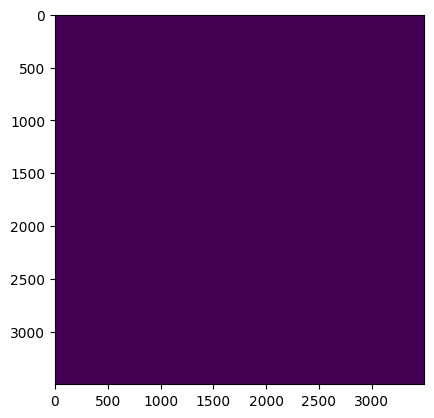

In [22]:
img = np.zeros((3500, 3500), dtype=np.uint8)
radius = radii[0]
centre = (cx[0],cy[0])
footprint = skimage.morphology.disk(radius)
img[footprint] = 1

plt.imshow(img)

In [23]:
plate_image_6440 = PlateImage(2, 3, np.asarray(full_plate_6440), 
                              (255 - np.asarray(full_plate_mask_6440))/255, inverted=True)

In [24]:
# Getting automated position of the wells and checking for correctness by plotting

well_dict_6440 = plate_image_6440.get_well_positions()
well_dict_6440.keys()


dict_keys([0, 1, 2, 3, 4, 5])

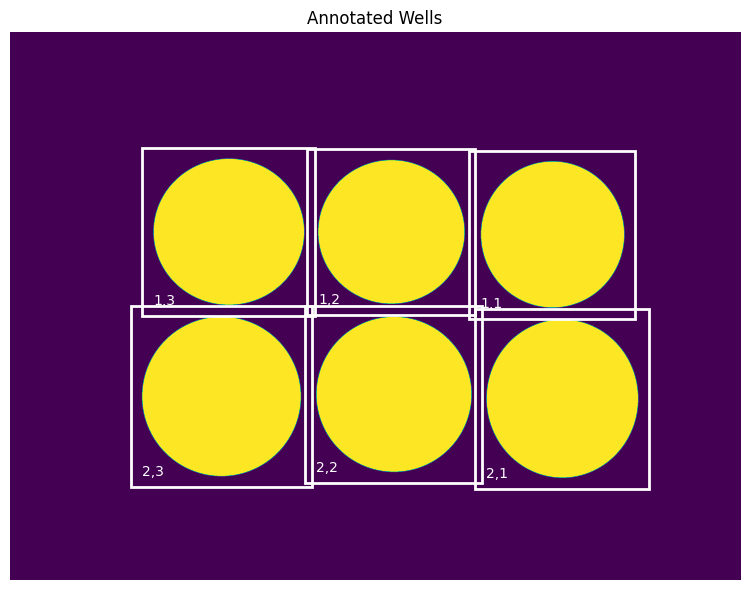

In [25]:
plate_image_6440.plot_well_positions(save=True)

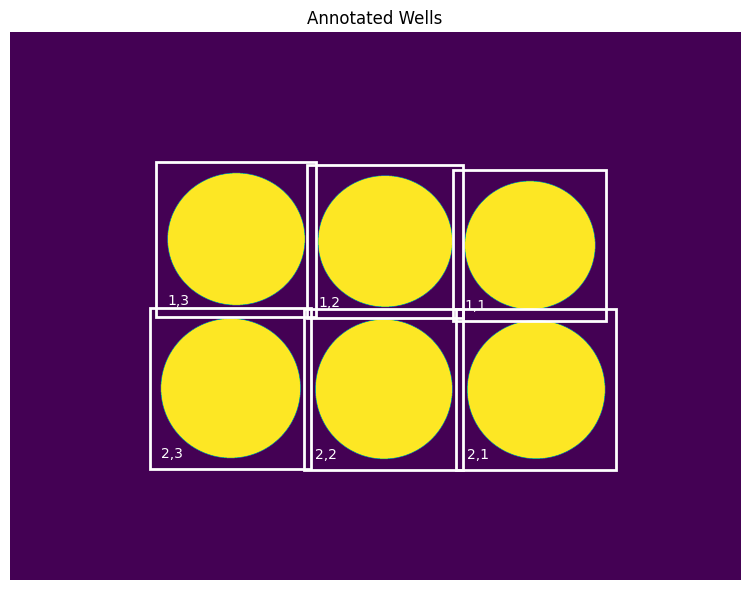

In [26]:
plate_image_6446 = PlateImage(2, 3, np.asarray(full_plate_6446), 
                              (255 - np.asarray(full_plate_mask_6446))/255, inverted=True)

plate_image_6446.plot_well_positions()

In [27]:
well_dict_6440[0].keys()

dict_keys(['masked_img', 'mask', 'img', 'maxr', 'minc', 'minr', 'maxc', 'nrow', 'ncol'])

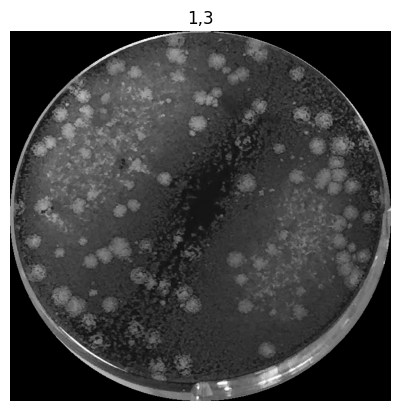

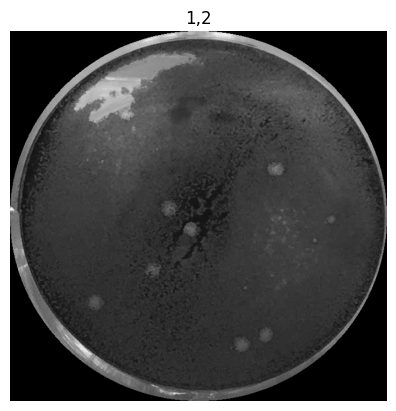

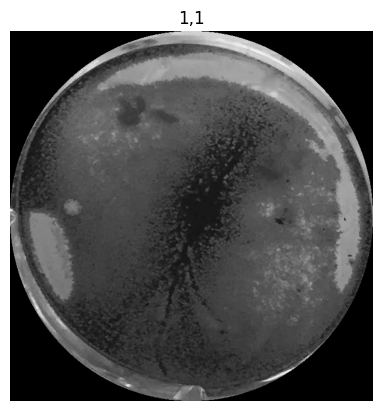

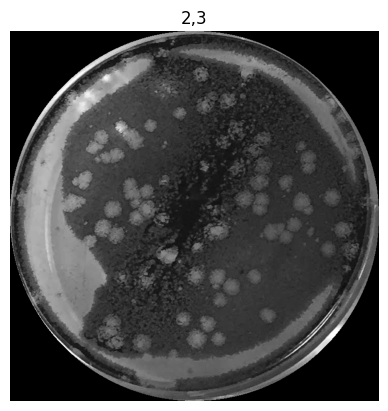

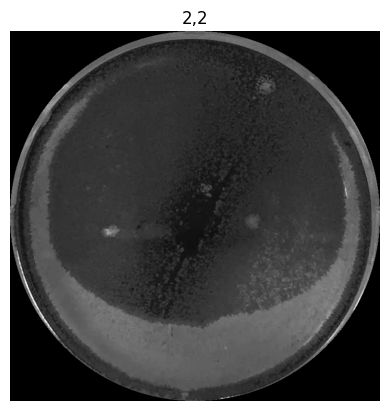

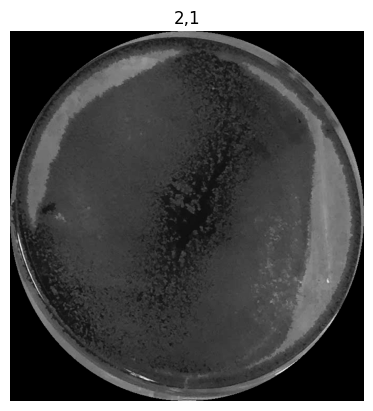

In [28]:
#Printing individual masked wells marked by positions of the wells

for idx in well_dict_6440:
    plt.figure()
    plt.axis('off')
    plt.imshow(well_dict_6440[idx]['masked_img'],cmap='gray')
    # plt.savefig("../../../manuscript/figs/masked_well_6440_"+str(well_dict_6440[idx]['nrow'])+str(well_dict_6440[idx]['ncol'])+".png",bbox_inches='tight', dpi=300)
    plt.title(str(well_dict_6440[idx]['nrow'])+","+str(well_dict_6440[idx]['ncol']))

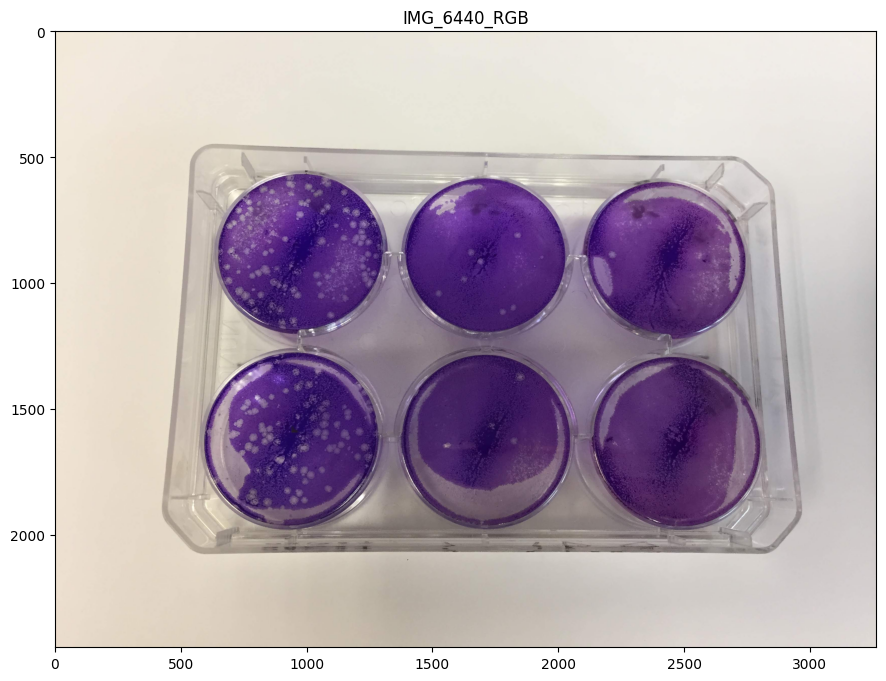

In [29]:
#Here we try to look at the same plate as before but now in RGB

exp = ExperimentCrystalVioletPlaque('','')
#Reading the plate image and mask from the path
full_plate_rgb_6440 = exp.read_from_path('../data/samples_suba/Full_plate_images/IMG_6440.png',
                                         color_mode = "rgb")



plt.figure(figsize=(32,8))
plt.subplot(1, 2, 1)
plt.title('IMG_6440_RGB')
plt.imshow(full_plate_rgb_6440)

In [30]:
print(np.array(full_plate_rgb_6440).shape)
full_plate_rgb_6440 = np.array(full_plate_rgb_6440)

(2448, 3264, 3)


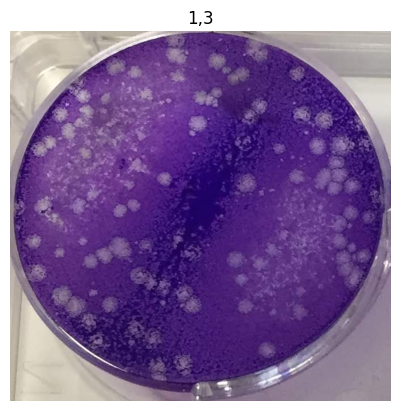

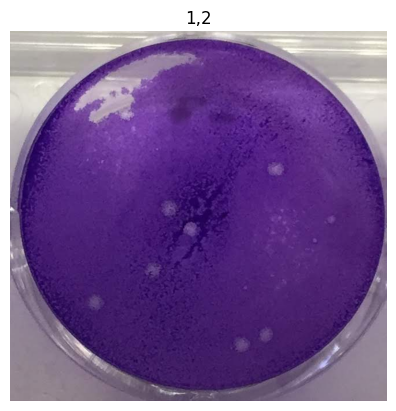

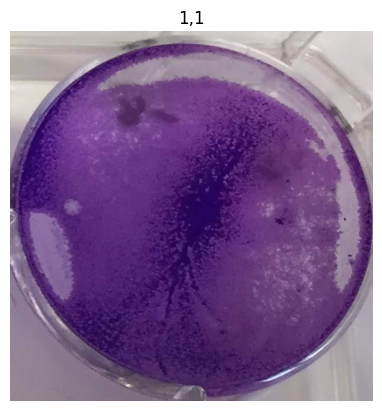

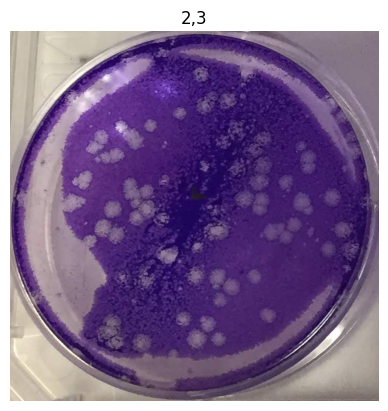

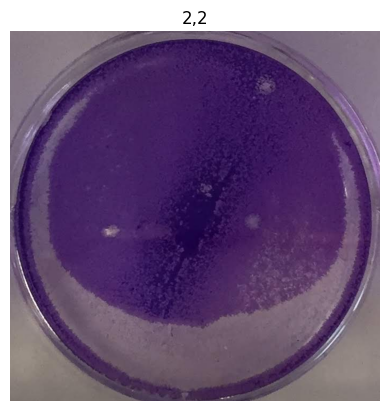

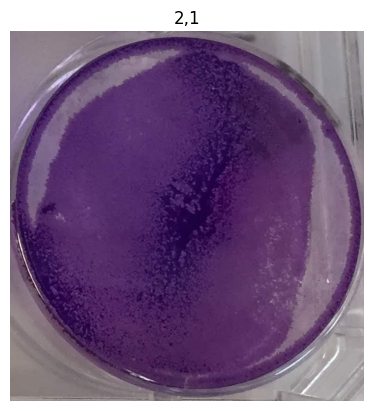

In [31]:
#Printing individual wells from the actual well plate image marked by positions of the wells

for idx in well_dict_6440:
    well = full_plate_rgb_6440[well_dict_6440[idx]['minr']:well_dict_6440[idx]['maxr'],
                               well_dict_6440[idx]['minc']:well_dict_6440[idx]['maxc']]

    plt.figure()
    plt.axis('off')
    plt.imshow(well)
    # plt.savefig("../../../manuscript/figs/actual_well_6440_"+str(well_dict_6440[idx]['nrow'])+str(well_dict_6440[idx]['ncol'])+".png",bbox_inches='tight', dpi=300)
    plt.title(str(well_dict_6440[idx]['nrow'])+","+str(well_dict_6440[idx]['ncol']))

In [32]:
#In case we do not care about the position of specific wells
well_crops = plate_image_6440.get_wells()
print(type(well_crops))
print(len(well_crops))

<class 'list'>
6


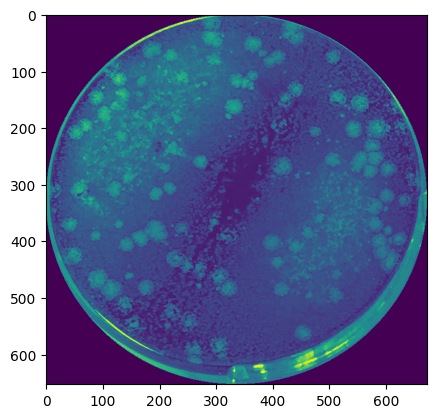

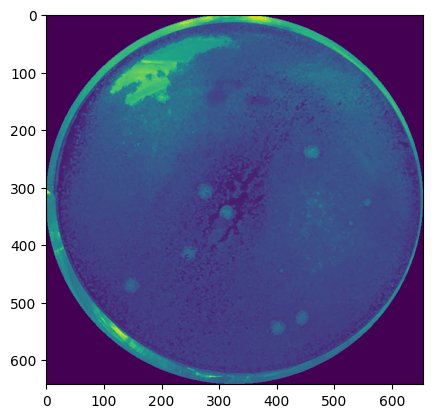

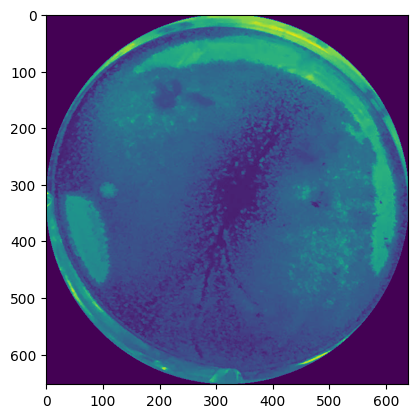

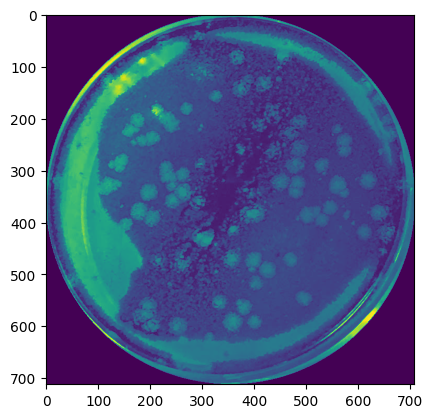

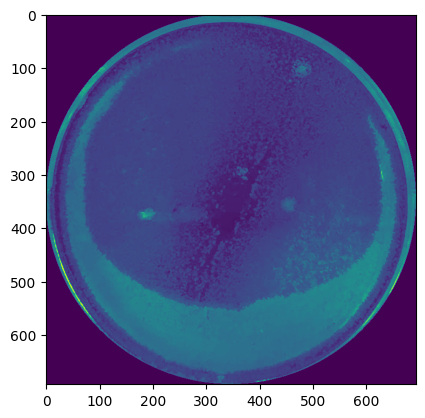

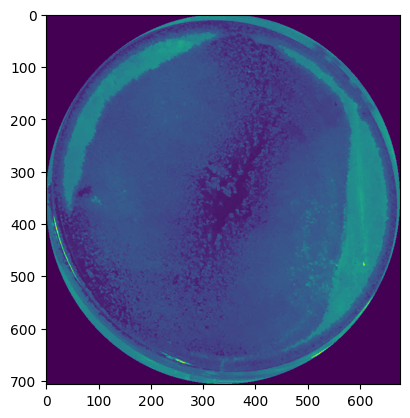

In [33]:
for w in well_crops:
    plt.figure()
    plt.imshow(w)

In [34]:
#Further Work:
# - incorporate test cases
# -Track plaques over time
# -Find bacterial colonies


## ROUGH WORK

(566, 641, 1219, 1314)
(572, 1376, 1214, 2030)
(578, 2103, 1231, 2743)
(1272, 590, 1984, 1299)
(1272, 1368, 1965, 2061)
(1284, 2128, 1991, 2805)


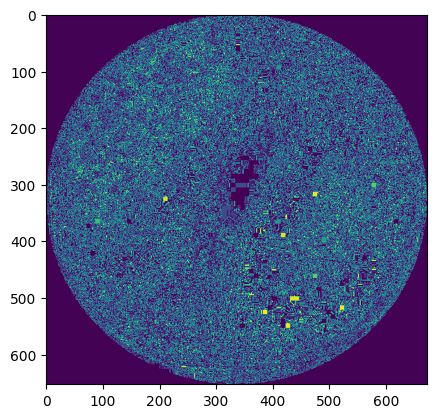

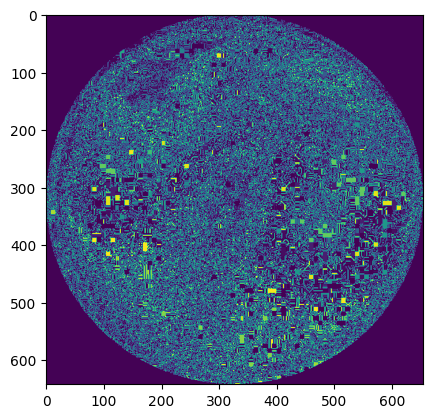

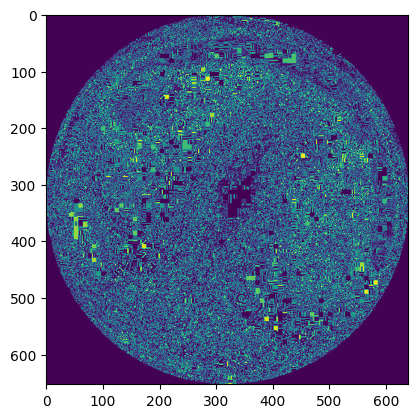

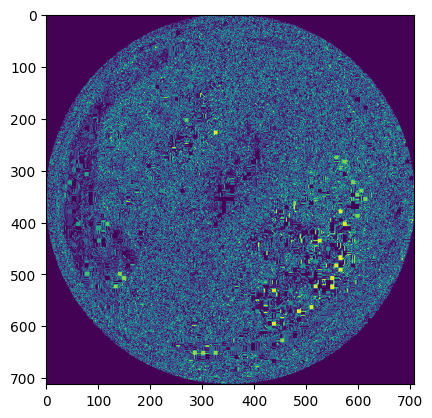

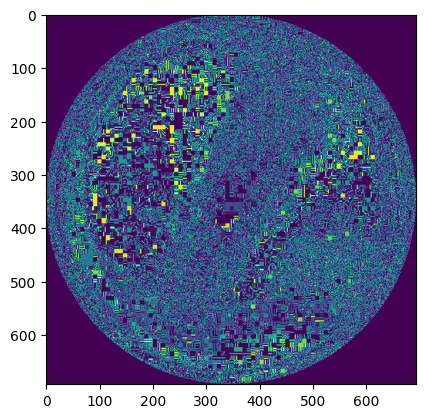

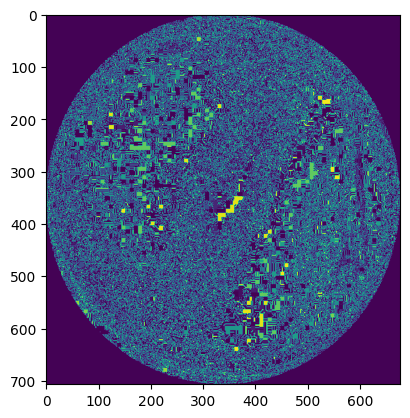

In [35]:
from skimage.measure import regionprops,label
from skimage.segmentation import clear_border
min_area = 100

well_crops = []
for well in regionprops(label(clear_border((255 - np.asarray(full_plate_mask_6440))))):
    if well.area >= min_area:
        print(well.bbox)
        minr, minc, maxr, maxc = well.bbox
        masked_img = np.asarray(full_plate_6440) ** (255 -np.asarray(full_plate_mask_6440))
        well_crops.append(masked_img[minr:maxr, minc:maxc])
        plt.figure()
        plt.imshow(masked_img[minr:maxr, minc:maxc])

In [36]:
l1 = [1,2,3,4,5,6]
l2 = [1,2,3,4,5,6]

l3 = []

for i in range(len(l1)):
    l3.append((1,1))

print(l3)

[(1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1)]


In [37]:
for (i,j) in l3:
    print(i+j)

2
2
2
2
2
2
